In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from PIL import Image, ImageDraw
import json

Dataset Structure:
bobcat: 4927 images
coyote: 6202 images
deer: 6055 images
empty: 183 images
fox: 1092 images
mountain_lion: 32 images


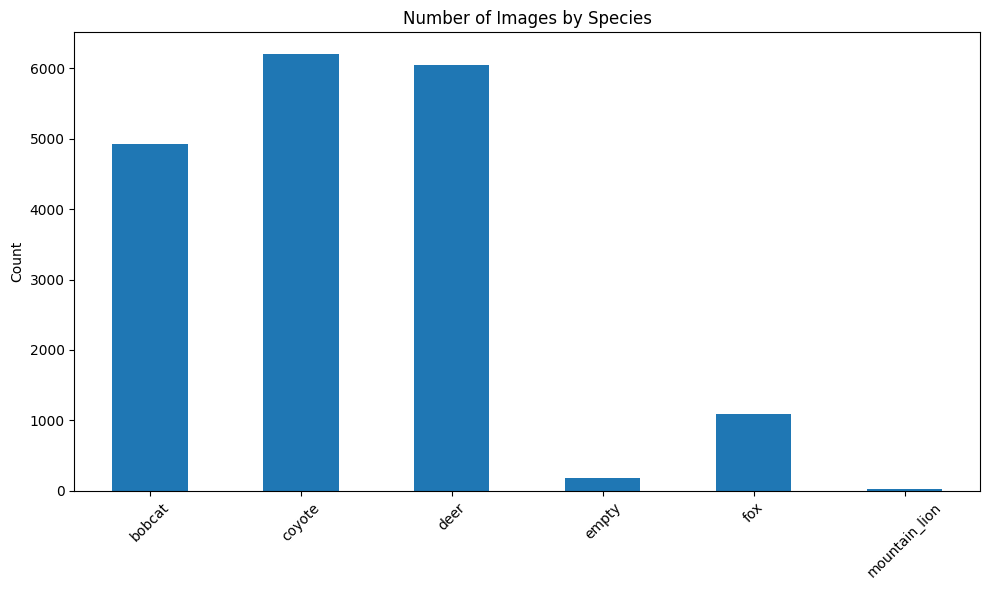

{'bobcat': 4927,
 'coyote': 6202,
 'deer': 6055,
 'empty': 183,
 'fox': 1092,
 'mountain_lion': 32}

In [28]:
data_dir = Path('../data/full_s3')

def count_images():
    species_folders = [f for f in data_dir.iterdir() if f.is_dir()]
    
    print("Dataset Structure:")
    print("=================")
    
    species_counts = {}
    for species in species_folders:
        image_count = len(list(species.glob('*.jpg')))
        species_counts[species.name] = image_count
        print(f"{species.name}: {image_count} images")
    
    # Create a bar plot
    plt.figure(figsize=(10, 6))
    pd.Series(species_counts).plot(kind='bar')
    plt.title('Number of Images by Species')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    return species_counts

count_images()
# data_dir = Path('../data/local/processed_dataset')
# count_images()

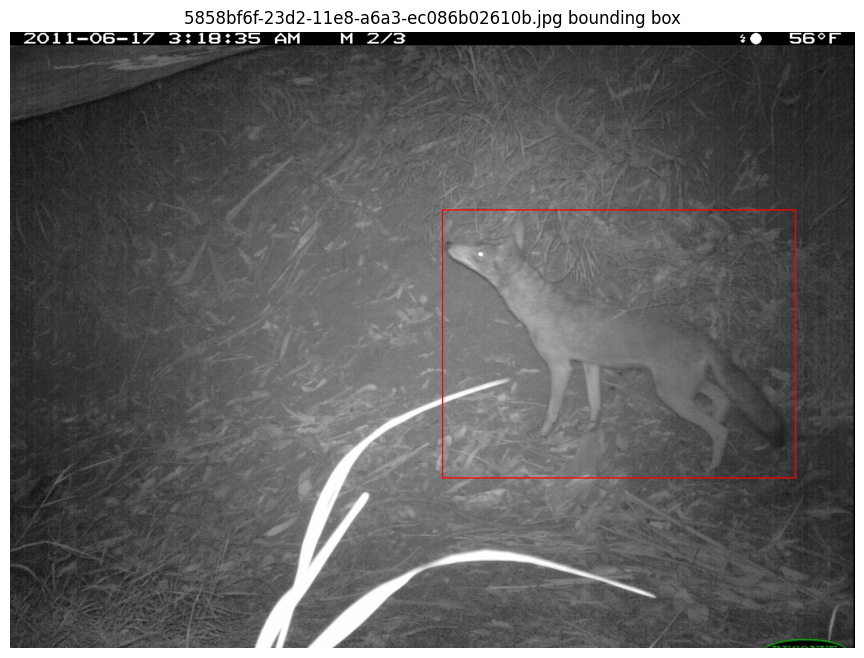

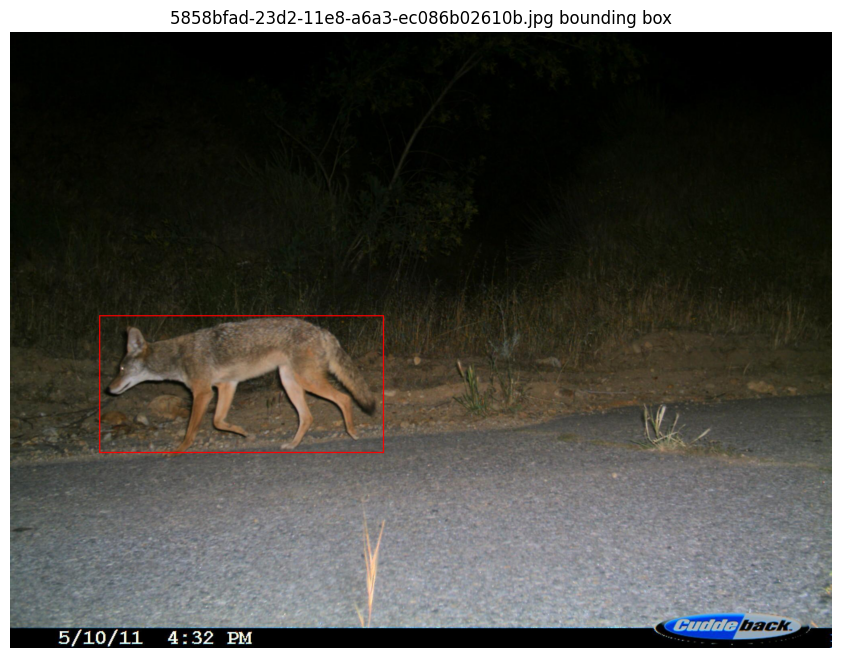

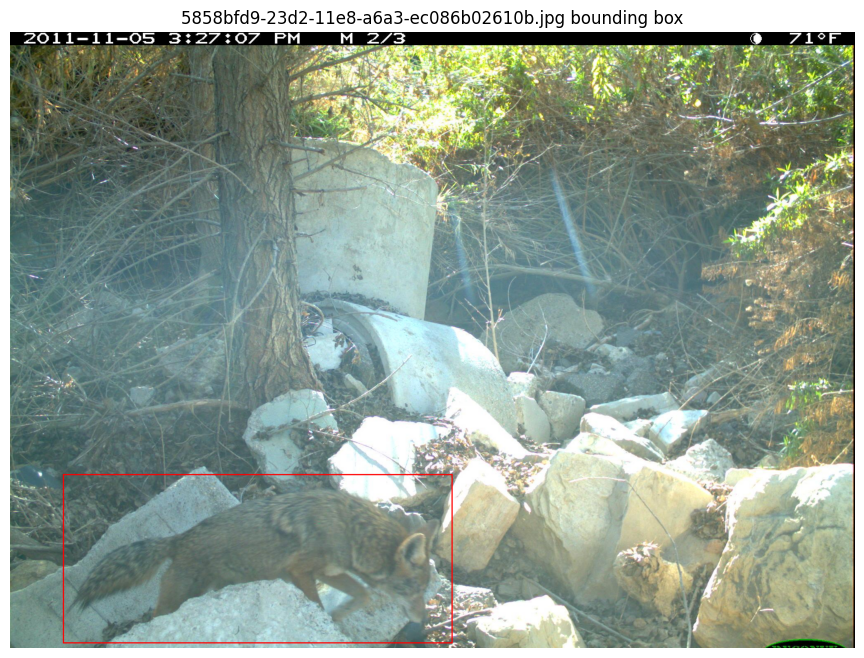

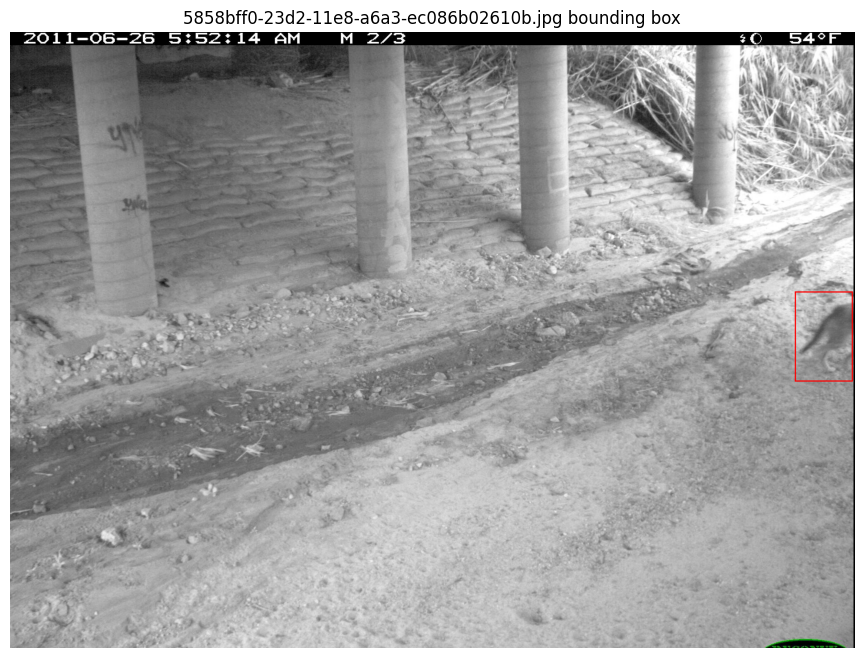

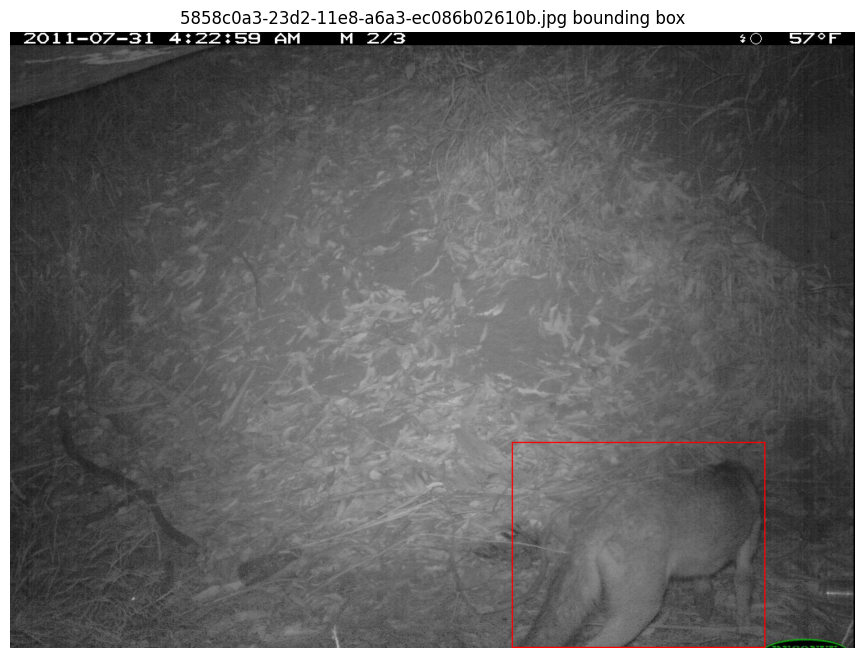

...

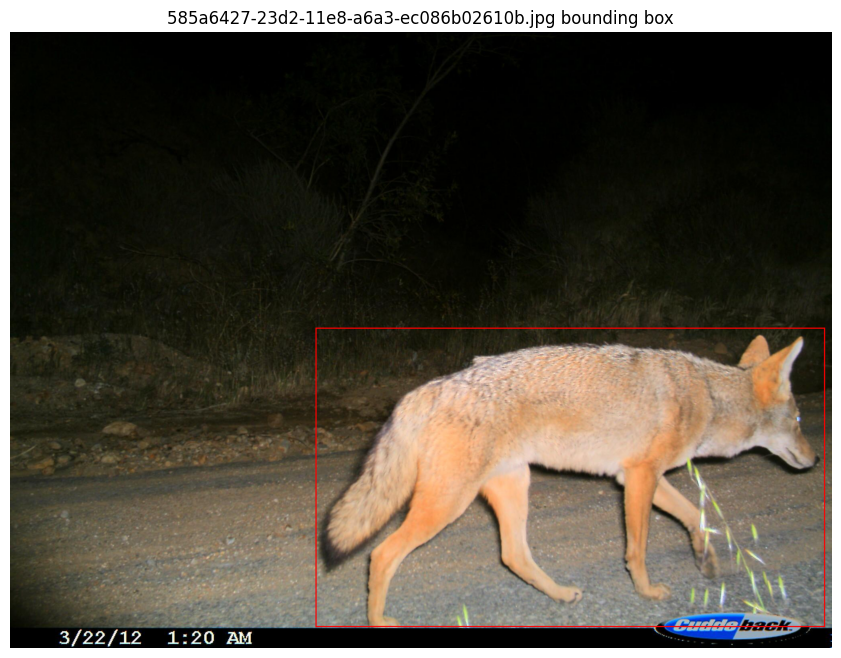

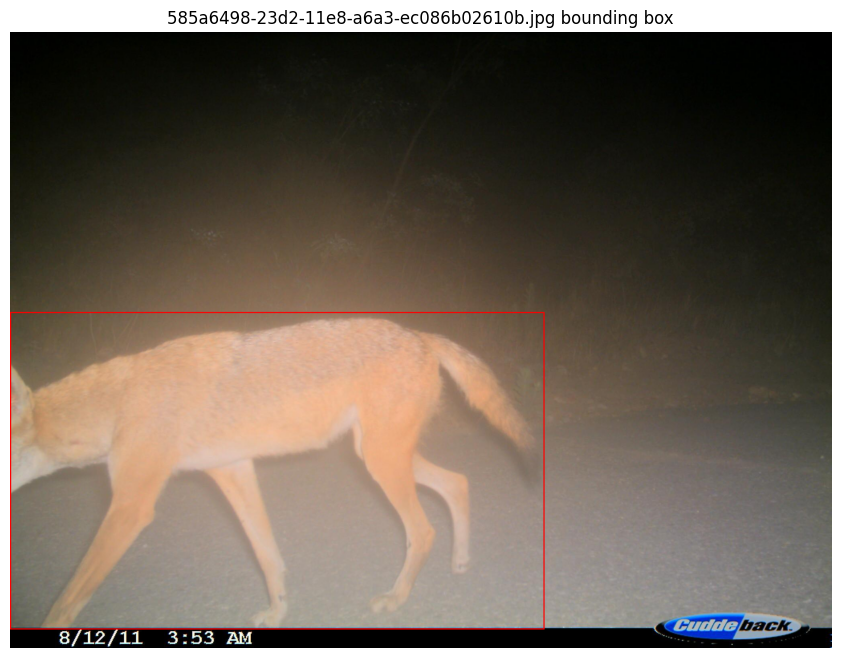

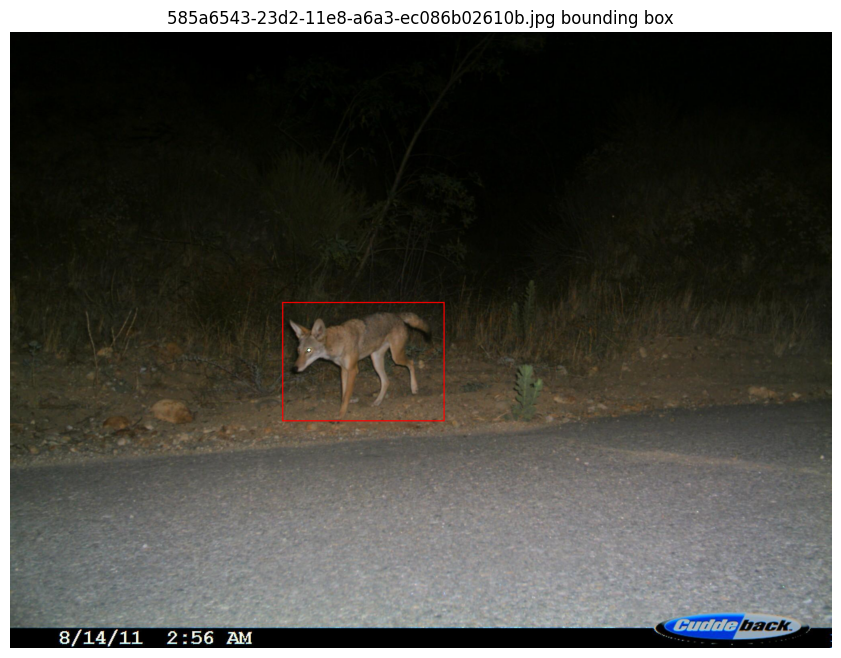

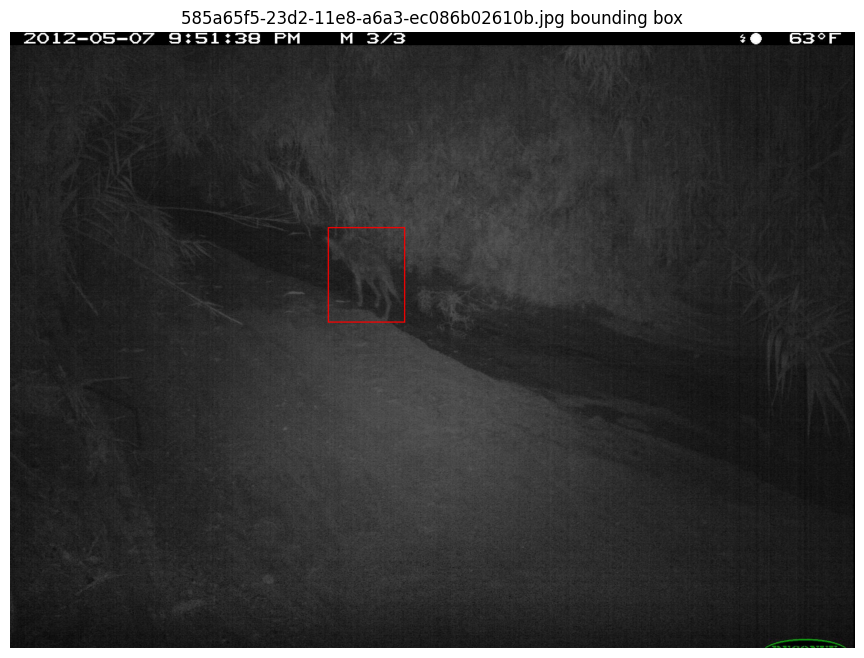

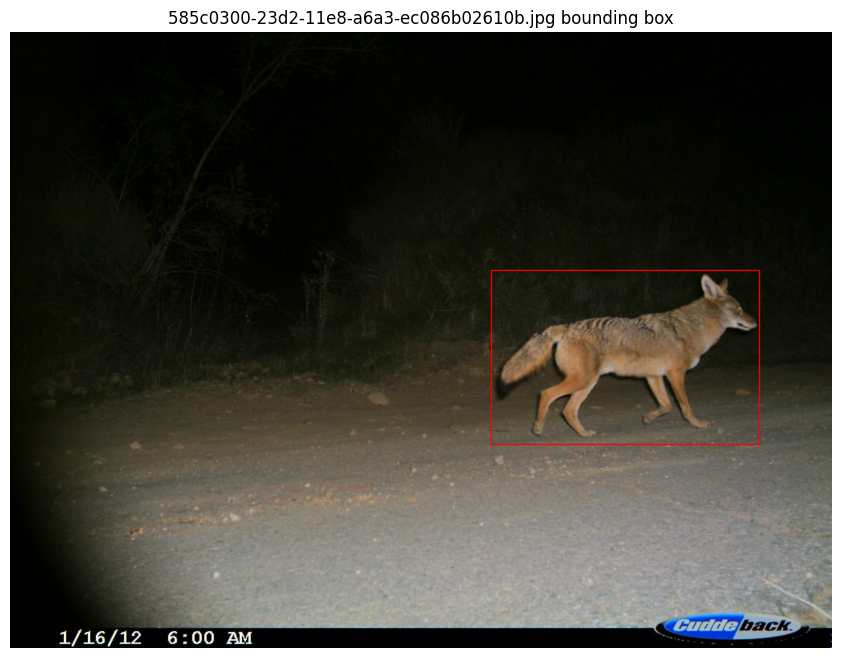

In [33]:
with open('bboxes.json', 'r') as f:
    data = json.load(f)

annotation_dict = {}
for ann in data["annotations"]:
    annotation_dict[f"{ann['image_id']}.jpg"] = ann["bbox"]

container = []
coyote_path = data_dir / "coyote"

count = 0
for coyote in coyote_path.iterdir():
    if count < 20:
        container.append(coyote)
        count += 1
    else:
        break

for coyote in container:
    bbox = annotation_dict[coyote.name] 

    img = Image.open(coyote)  
    draw = ImageDraw.Draw(img)

    x = bbox.pop(0)
    y = bbox.pop(0)
    w = bbox.pop(0)
    h = bbox.pop(0)
    
    draw.rectangle([x, y, x + w, y + h], outline="red", width=3)
    
    # Display the image with bounding boxes
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(f"{coyote.name} bounding box")  
    plt.axis('off')
    plt.show()